# YOLOv5 for survivor detection in Post Disaster Scenarios

Steps involved:

* Installing YOLOv5 dependencies
* Downloading custom YOLOv5 object detection data for post disaster scenarios
* YOLOv5 Training configuration
* Training YOLOv5 for survivor detection
* Evaluating YOLOv5 performance
* Visualizing YOLOv5 training data
* Running YOLOv5 inference on test images
* Exporting saved YOLOv5 weights for future inference in ensemble model



In [ ]:
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive # creating a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
%cd /mydrive/Final_Year_Project/YOLOv5

/
Mounted at /content/gdrive
/content/gdrive/My Drive/Final_Year_Project/YOLOv5


#Installing Dependencies


In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 15529, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 15529 (delta 49), reused 119 (delta 43), pack-reused 15393
Receiving objects: 100% (15529/15529), 14.53 MiB | 15.51 MiB/s, done.
Resolving deltas: 100% (10578/10578), done.
/content/gdrive/My Drive/Final_Year_Project/YOLOv5/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 57.4 MB/s eta 0:00:00
Setup complete. Using torch 2.0.0+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


# Downloading Formatted Custom Dataset 

Formatted and Augmented Post disaster dataset is downloaded from Roboflow using the "**YOLOv5 PyTorch**" export format.

In [ ]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="9KG0WhvnpHGdnlOuXdur")
project = rf.workspace("final-year-project-deylr").project("ensemble-3ipxs")
dataset = project.version(1).download("yolov5")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.4 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Ensemble-1 in yolov5pytorch:: 100%|██████████| 492/492 [00:04<00:00, 112.14it/s]


In [ ]:
%cd Ensemble-1
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/Ensemble-1


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- car
- people
nc: 2
roboflow:
  license: CC BY 4.0
  project: ensemble-3ipxs
  url: https://universe.roboflow.com/final-year-project-deylr/ensemble-3ipxs/dataset/1
  version: 1
  workspace: final-year-project-deylr
test: ../test/images
train: Ensemble-1/train/images
val: Ensemble-1/valid/images


# Defining Model Configuration and Architecture

A yaml script that defines the parameters for our model like the number of classes, anchors, and each layer is written.

In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial 
%cd ..
%cat models/yolov5s.yaml

/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsa

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Training Custom YOLOv5 Detector

Here, we pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
# %cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 1000 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

2023-04-16 16:00:49.284961: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-16 16:00:50.165869: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/Ensemble-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1000, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze

# Evaluating Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

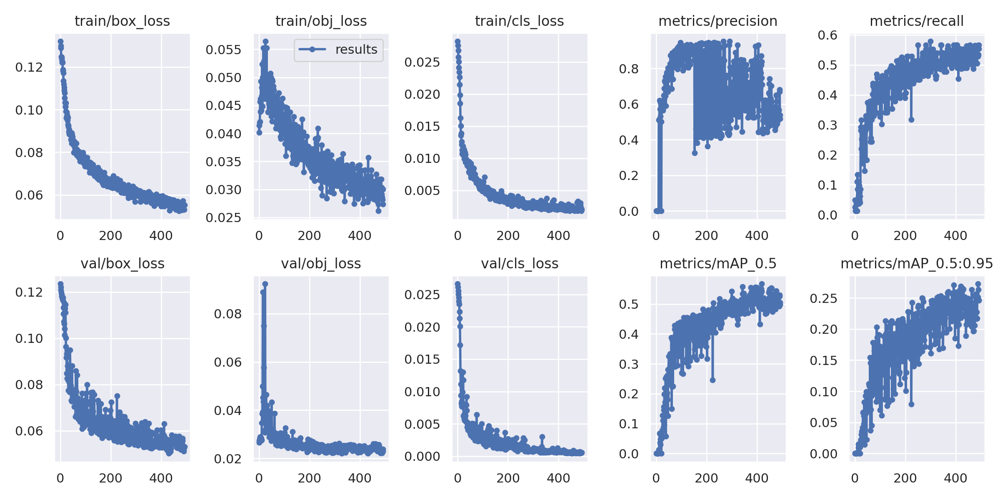

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

### Visualizing Our Training Data with Labels

After training starts, `train*.jpg` is viewed to see training images, labels and augmentation effects.

GROUND TRUTH TRAINING DATA:


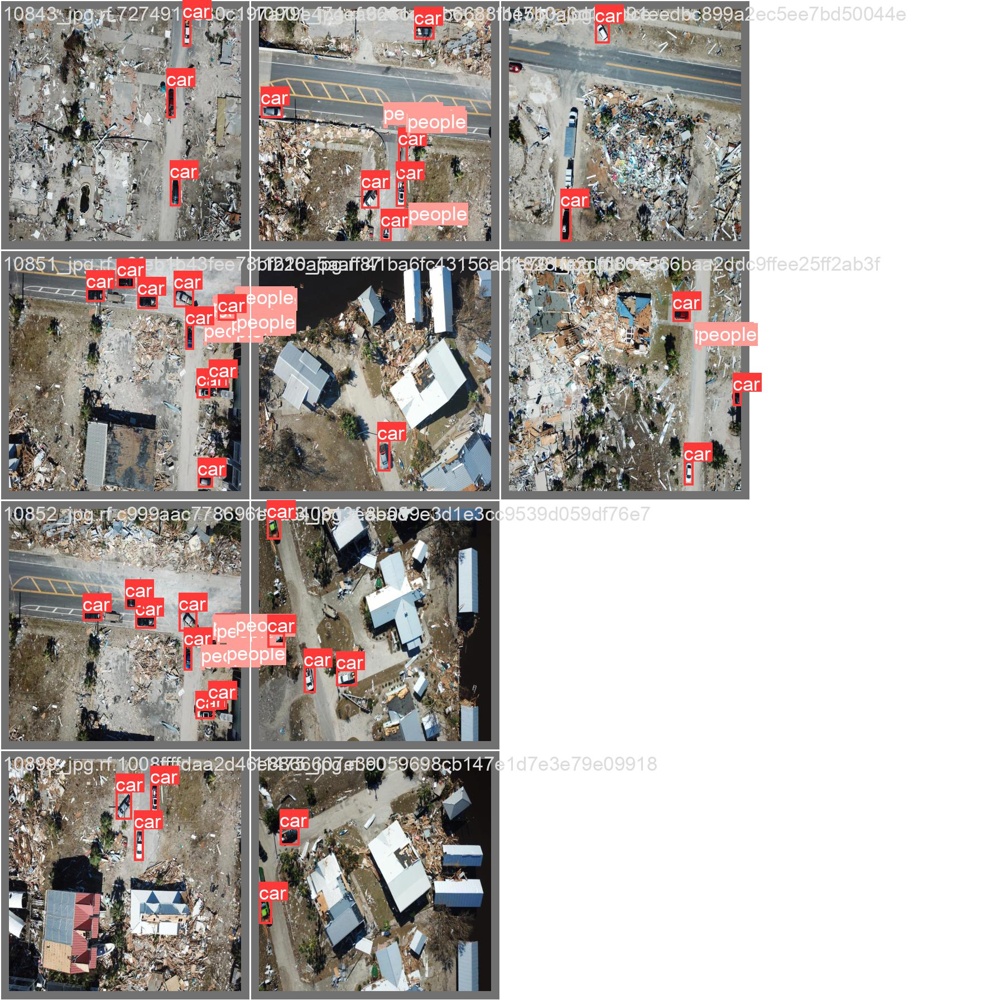

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=1200)

GROUND TRUTH AUGMENTED TRAINING DATA:


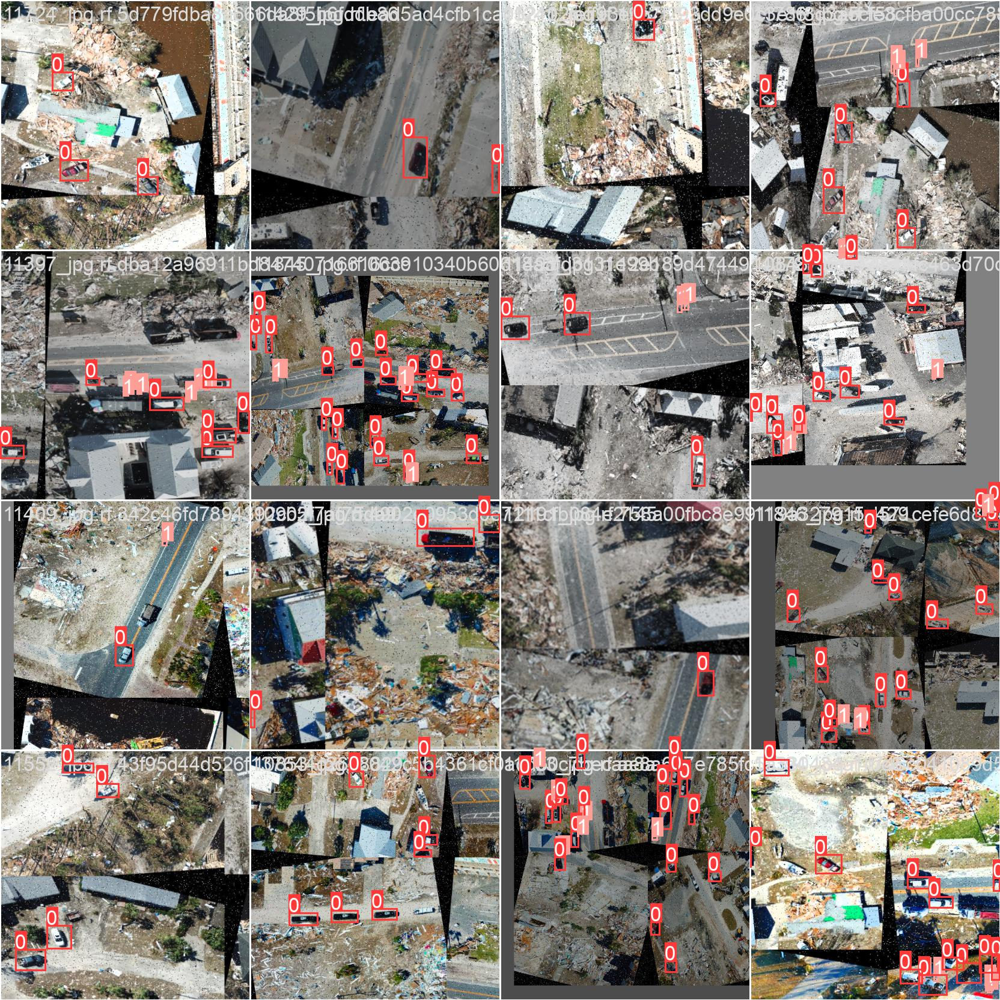

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=1200)

#Running Inference  With Trained Weights
Running inference with a pretrained checkpoint on contents of `test/images` folder.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
# %cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source Ensemble-1/test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=Ensemble-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7249215 parameters, 0 gradients
image 1/20 /content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/Ensemble-1/test/images/10841_jpg.rf.811a32556aa426d0283dedeb66a30f76.jpg: 416x416 2 cars, 8.0ms
image 2/20 /content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/Ensemble-1/test/images/10845_jpg.rf.831f9370458b622529c6c194bb1af86f.jpg: 416x416 4 cars, 11.9ms
image 3/2

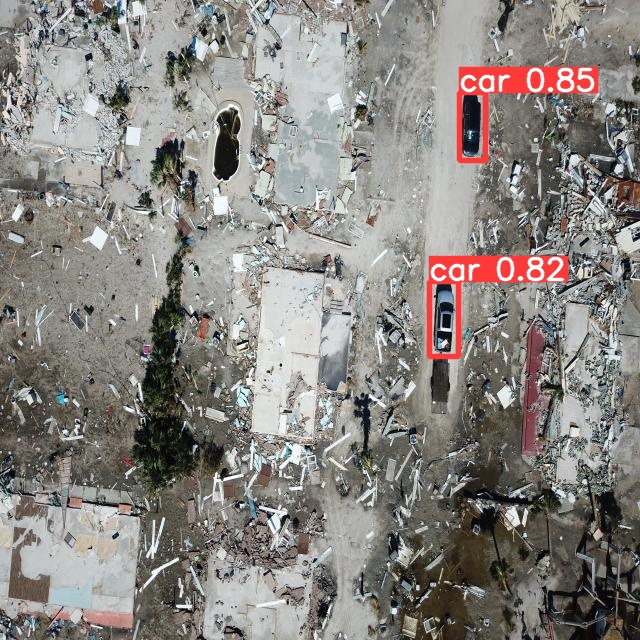

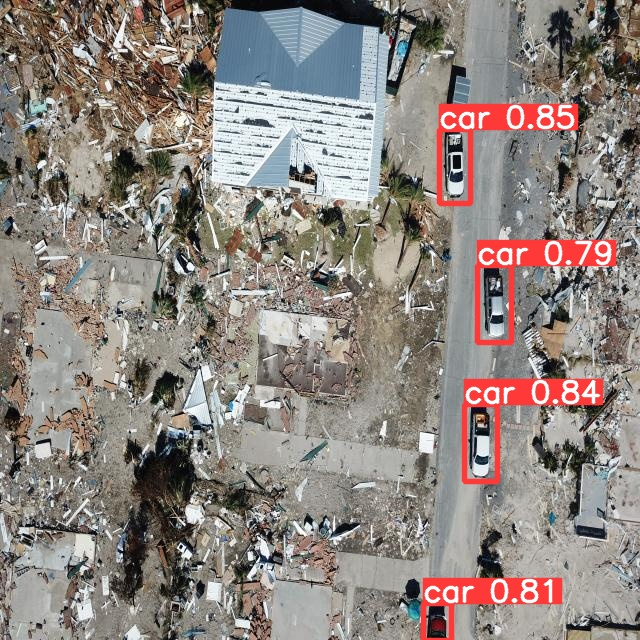

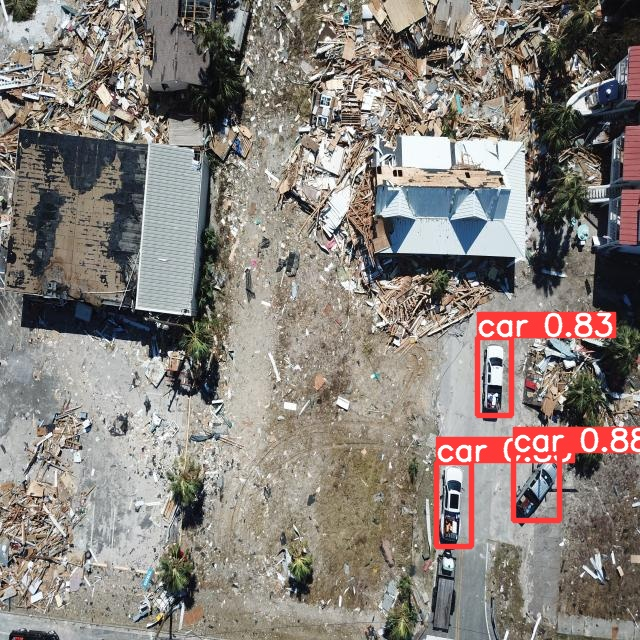

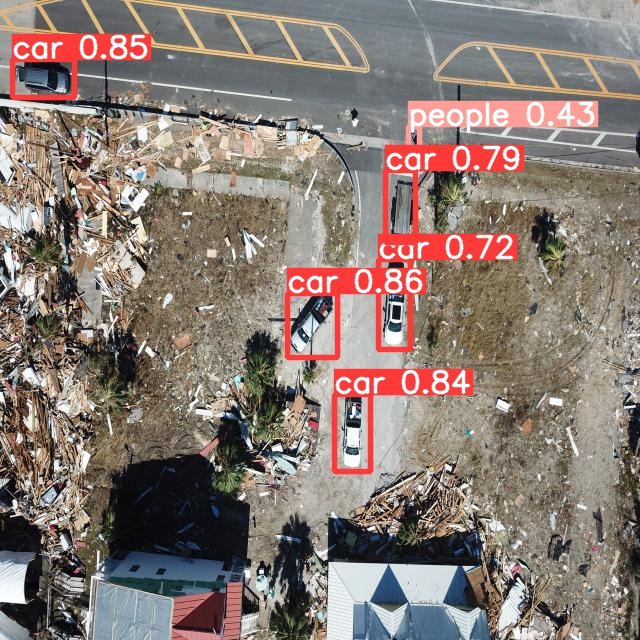

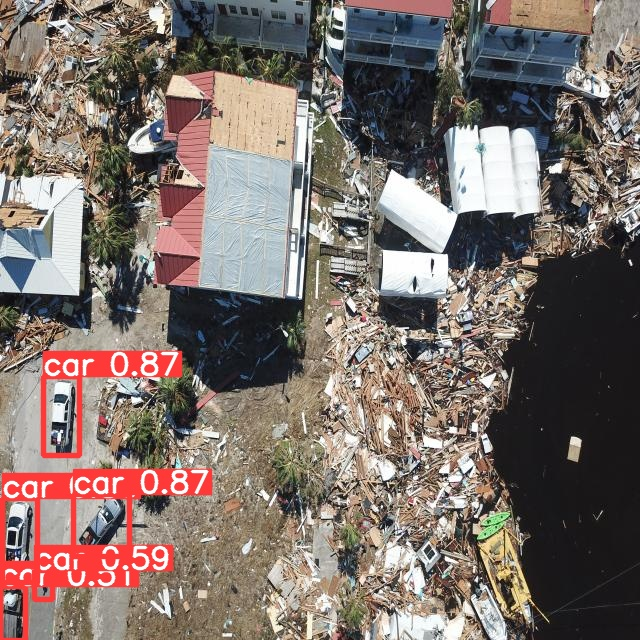

...

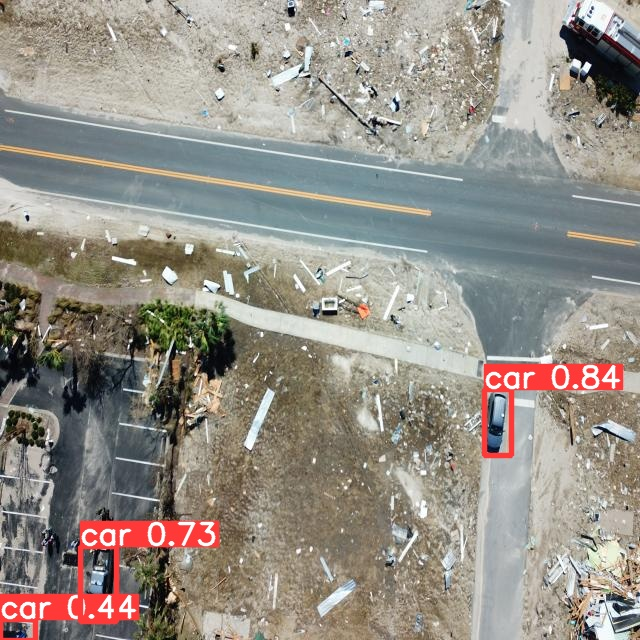

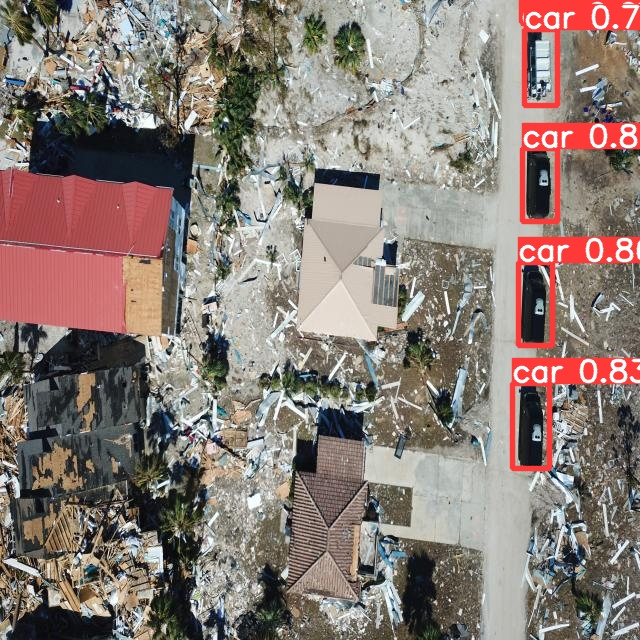

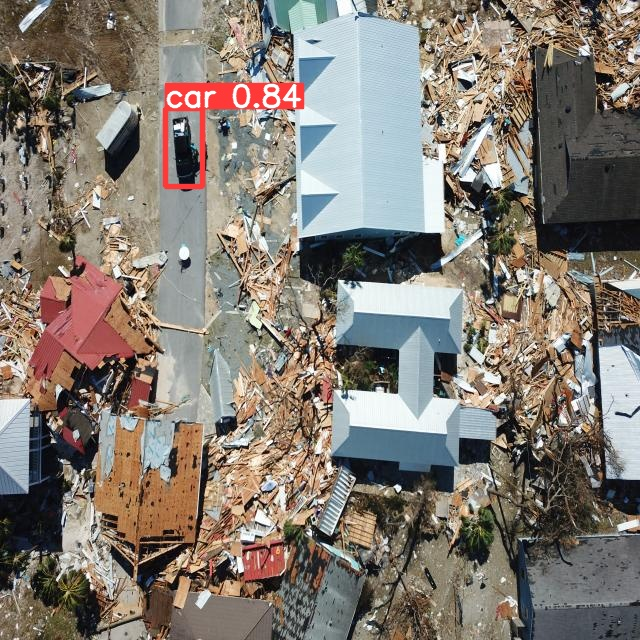

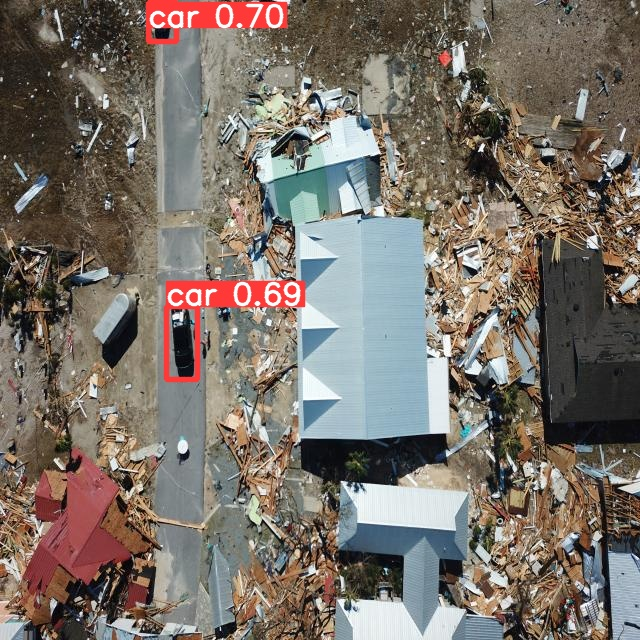

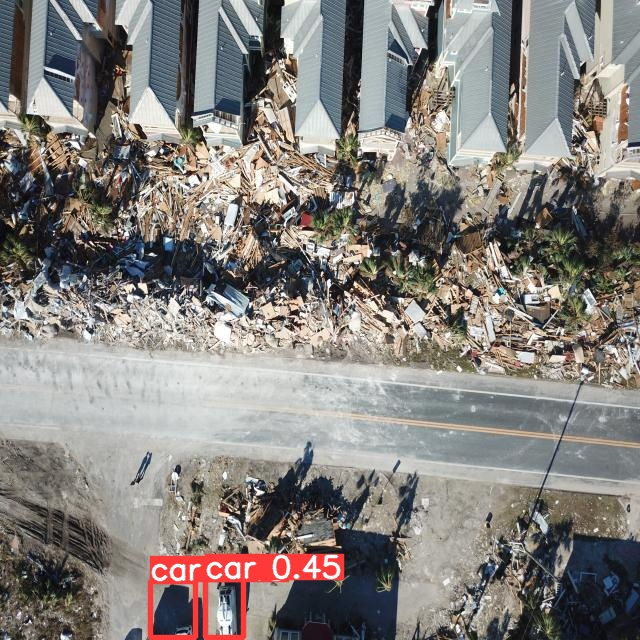

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Deploy Model Weights

In [ ]:
project.version(dataset.version).deploy(model_type="yolov5", model_path=f"/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/runs/train/yolov5s_results/")

An error occured when getting the model upload URL: This version already has a trained model. Please generate and train a new version in order to upload model to Roboflow.


In [ ]:
#Run inference on your model on a persistant, auto-scaling, cloud API

#load model
model = project.version(dataset.version).model

#choose random test set image
import os, random
test_set_loc = dataset.location + "/test/images/"
random_test_image = random.choice(os.listdir(test_set_loc))
print("running inference on " + random_test_image)

pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
pred

running inference on 11831_jpg.rf.d30e29fe7db94f55d0508299857205a3.jpg


{'predictions': [{'x': 538.5,
   'y': 182.0,
   'width': 33.0,
   'height': 80.0,
   'confidence': 0.7477319836616516,
   'class': 'car',
   'image_path': '/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/Ensemble-1/test/images/11831_jpg.rf.d30e29fe7db94f55d0508299857205a3.jpg',
   'prediction_type': 'ObjectDetectionModel'},
  {'x': 532.0,
   'y': 428.5,
   'width': 32.0,
   'height': 79.0,
   'confidence': 0.6995360851287842,
   'class': 'car',
   'image_path': '/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/Ensemble-1/test/images/11831_jpg.rf.d30e29fe7db94f55d0508299857205a3.jpg',
   'prediction_type': 'ObjectDetectionModel'},
  {'x': 535.0,
   'y': 308.0,
   'width': 30.0,
   'height': 84.0,
   'confidence': 0.5044832229614258,
   'class': 'car',
   'image_path': '/content/gdrive/MyDrive/Final_Year_Project/YOLOv5/yolov5/Ensemble-1/test/images/11831_jpg.rf.d30e29fe7db94f55d0508299857205a3.jpg',
   'prediction_type': 'ObjectDetectionModel'},
  {'x': 541.5,
   'y': 65